<a href="https://colab.research.google.com/github/yaolihua081/AIG_PC/blob/main/Sklearn_PCTopicModeling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Gensim was primarily developed for topic modeling. However, it now supports a variety of other NLP tasks such as converting words to vectors (word2vec), document to vectors (doc2vec), finding text similarity, and text summarization.

https://nlpforhackers.io/topic-modeling/

The link contains articles about topic modling codes

https://medium.com/@nqabell89/visualizing-unsupervised-text-classification-output-with-pyldavis-370c1784ed58

In [1]:
!pip install pyLDAvis
#restart runtime

     |████████████████████████████████| 1.7MB 7.1MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 9.9MB 23.5MB/s 
     |████████████████████████████████| 15.3MB 248kB/s 
  Created wheel for pyLDAvis: filename=pyLDAvis-3.3.1-cp37-none-any.whl size=136870 sha256=d23c256d5bae7978c8b5040882742a692504ee94cc4d7b2ef1259f78718dde14
  Stored in directory: /root/.cache/pip/wheels/a0/9c/fc/c6e00689d35c82cf96a8adc70edfe7ba7904374fdac3240ac2
Successfully built pyLDAvis
ERROR: tensorflow 2.4.1 has requirement numpy~=1.19.2, but you'll have numpy 1.20.3 which is incompatible.
ERROR: google-colab 1.0.0 has requirement pandas~=1.1.0; python_version >= "3.0", but you'll have pandas 1.2.4 which is incompatible.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
ERROR: albumentations 0

In [1]:
'''
Step 1
Loading Gensim and nltk libraries
'''
# pip install gensim
import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from nltk.stem import WordNetLemmatizer, SnowballStemmer
from nltk.stem.porter import *
import numpy as np
np.random.seed(400)
import nltk
import pandas as pd
stemmer = SnowballStemmer("english")
nltk.download('wordnet')

import re
from gensim import models, corpora
from nltk import word_tokenize
from nltk.corpus import stopwords


[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


In [2]:
'''
Step 2, upload files
'''
#!pip install kaggle
from google.colab import files
files.upload()

Saving PC090000items.docx to PC090000items.docx
Saving PC090100items.docx to PC090100items.docx
Saving PC090200items.docx to PC090200items.docx
Saving PC090300items.docx to PC090300items.docx
Saving PC090400items.docx to PC090400items.docx
Saving PC090500items.docx to PC090500items.docx
Saving PC090600items.docx to PC090600items.docx
Saving PC090700items.docx to PC090700items.docx
Saving PC090800items.docx to PC090800items.docx
Saving PC090900items.docx to PC090900items.docx
Saving PC091000items.docx to PC091000items.docx
Saving PC091100items.docx to PC091100items.docx
Saving PC091200items.docx to PC091200items.docx
Saving PC091300items.docx to PC091300items.docx
Saving PC091400items.docx to PC091400items.docx
Saving PC091500items.docx to PC091500items.docx
Saving PC091600items.docx to PC091600items.docx
Saving PC091700items.docx to PC091700items.docx
Saving PC091800items.docx to PC091800items.docx
Saving PC091900items.docx to PC091900items.docx
Saving PC092000items.docx to PC092000ite

{'PC090000items.docx': b'PK\x03\x04\x14\x00\x06\x00\x08\x00\x00\x00!\x00z\x03\x87Q\xcc\x01\x00\x00\x1f\x08\x00\x00\x13\x00\x08\x02[Content_Types].xml \xa2\x04\x02(\xa0\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\

In [4]:
'''
Step 3 define function to read in word document files and a function to prepare train and test document
'''
! pip install python-docx 
import docx


def readtxt(filename):
    doc = docx.Document(filename)
    fullText = []
    for para in doc.paragraphs:
        fullText.append(para.text)
    return '\n'.join(fullText)

def combine_doc(num1, num2):
  total=""
  for i in range(num1,num2):
    if num1<10:
      name="PC090"+str(i)+"00"+"items.docx"
    else:
      name="PC09"+str(i)+"00"+"items.docx"
    total+=readtxt(name)
    #print(str(i))
  return total


     |████████████████████████████████| 5.6MB 5.4MB/s 
  Created wheel for python-docx: filename=python_docx-0.8.11-cp37-none-any.whl size=184602 sha256=8392b6dfbbf4ad4fa05c3841d3dcfb6ad68e435a86e9434750c00aa6ccb5c861
  Stored in directory: /root/.cache/pip/wheels/a6/90/f1/a7cb70b38633ae04e7fb963b1c70f63fd6fc01c075b8230adc
Successfully built python-docx


In [5]:
'''
Step 4 Prepare train and test document
'''
train_document=combine_doc(0,10)+combine_doc(10,35)
test_document=combine_doc(35,38)
[len(train_document),len(test_document)]

[3946277, 311113]

In [7]:
'''
Change all text to lower cases
Step 5. Each pagraph/item is splixt by "New HumRRO
Train_tokens is a list and containes PC items/paragraph
'''
 
#train_tokens = [word for word in train_document.split("New HumRRO")]
#train_tokens=train_tokens[1:]

#test_tokens = [word for word in test_document.split("New HumRRO")]
#test_tokens=test_tokens[1:]

import re

train_tokens = re.split(r'New HumRRO|NEW HumRRO', train_document)
train_tokens=train_tokens[1:]
test_tokens = re.split(r'New HumRRO|NEW HumRRO', test_document)
test_tokens=test_tokens[1:]

#Gensim to run LDA Model

In [8]:
'''
Step 6 Write a function to perform the pre processing steps on the entire dataset
'''
def lemmatize_stemming(text):
    return stemmer.stem(WordNetLemmatizer().lemmatize(text, pos='v'))

# Tokenize and lemmatize
def preprocess(text):
    result=[]
    for token in gensim.utils.simple_preprocess(text) :
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3:
            result.append(lemmatize_stemming(token))
            
    return result

'''
Step 7
'''
train_processed_docs = [] # a list of a list of word

for doc in train_tokens:
    train_processed_docs.append(preprocess(doc))


'''
Step 8
Create a dictionary from 'processed_docs' containing the number of times a word appears 
in the training set using gensim.corpora.Dictionary and call it 'dictionary'
'''
gensm_dictionary = gensim.corpora.Dictionary(train_processed_docs)   
'''
OPTIONAL STEP
Remove very rare and very common words:

- words appearing less than 15 times
- words appearing in more than 10% of all documents
'''
gensm_dictionary.filter_extremes(no_below=15, no_above=0.1, keep_n= 100000)

'''
Step 9
Create the Bag-of-words model for each document i.e for each document we create a dictionary reporting how many
words and how many times those words appear. Save this to 'bow_corpus'
'''
bow_corpus = [gensm_dictionary.doc2bow(doc) for doc in train_processed_docs]

'''
Step 10
Train your lda model using gensim.models.LdaMulticore and save it to 'lda_model'
'''
# TODO
lda_model_gensm =  gensim.models.LdaMulticore(bow_corpus, 
                                   num_topics = 10, 
                                   id2word = gensm_dictionary,                                    
                                   passes = 10,
                                   workers = 2)


#Hide cell below

In [ ]:
'''
Step 11
For each topic, we will explore the words occuring in that topic and its relative weight
'''
#for idx, topic in lda_model_gensm.print_topics(-1):
#    print("Topic: {} \nWords: {}".format(idx, topic ))
#    print("\n")

'''
Step 10
Preview BOW for our sample preprocessed document
'''
#document_num = 20
#bow_doc_x = bow_corpus[document_num]

#for i in range(len(bow_doc_x)):
#    print("Word {} (\"{}\") appears {} time.".format(bow_doc_x[i][0], 
#                                                     gensm_dictionary[bow_doc_x[i][0]], 
#                                                     bow_doc_x[i][1]))

#NLTK package

In [9]:
'''

This is another code that use "Englis Stopword and remv some with length less than 2
'''
nltk.download('punkt')
nltk.download('stopwords')
NUM_TOPICS = 10
STOPWORDS = stopwords.words('english')
 
def clean_text(text):
    tokenized_text = word_tokenize(text.lower())
    cleaned_text = [t for t in tokenized_text if t not in STOPWORDS and re.match('[a-zA-Z\-][a-zA-Z\-]{2,}', t)]
    return cleaned_text
 # For gensim we need to tokenize the data and filter out stopwords
data=train_tokens
tokenized_data = []
for text in data:
    tokenized_data.append(clean_text(text))

#from gensim import models, corpora

# Build a Dictionary - association word to numeric id
dictionary = corpora.Dictionary(tokenized_data)
#dictionary.filter_extremes(no_below=7, no_above=0.8, keep_n= 100000), this code impact the results a lot
# Transform the collection of texts to a numerical form
corpus = [dictionary.doc2bow(text) for text in tokenized_data]
 
# Have a look at how the 20th document looks like: [(word_id, count), ...]
print(corpus[20])
# [(12, 3), (14, 1), (21, 1), (25, 5), (30, 2), (31, 5), (33, 1), (42, 1), (43, 2),  ...
 
# Build the LDA model
lda_model_nltk = models.LdaModel(corpus=corpus, num_topics=NUM_TOPICS, id2word=dictionary)
 
# Build the LSI model
lsi_model_nltk = models.LsiModel(corpus=corpus, num_topics=NUM_TOPICS, id2word=dictionary)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[(0, 1), (49, 1), (60, 1), (182, 1), (212, 2), (222, 11), (356, 1), (363, 1), (503, 1), (598, 1), (664, 2), (687, 1), (840, 1), (902, 1), (977, 1), (989, 1), (1016, 3), (1060, 1), (1091, 3), (1126, 1), (1133, 1), (1134, 2), (1135, 1), (1136, 2), (1137, 1), (1138, 5), (1139, 1), (1140, 1), (1141, 1), (1142, 1), (1143, 1), (1144, 1), (1145, 5), (1146, 2), (1147, 1), (1148, 1), (1149, 1), (1150, 1), (1151, 1), (1152, 1), (1153, 1), (1154, 1), (1155, 6), (1156, 1), (1157, 1), (1158, 1), (1159, 1), (1160, 1), (1161, 1), (1162, 4), (1163, 1), (1164, 1), (1165, 1), (1166, 1), (1167, 1), (1168, 1), (1169, 3), (1170, 1), (1171, 1)]


#Word Clouds of Top N Keywords in Each Topic
#Model Lda_NLTK

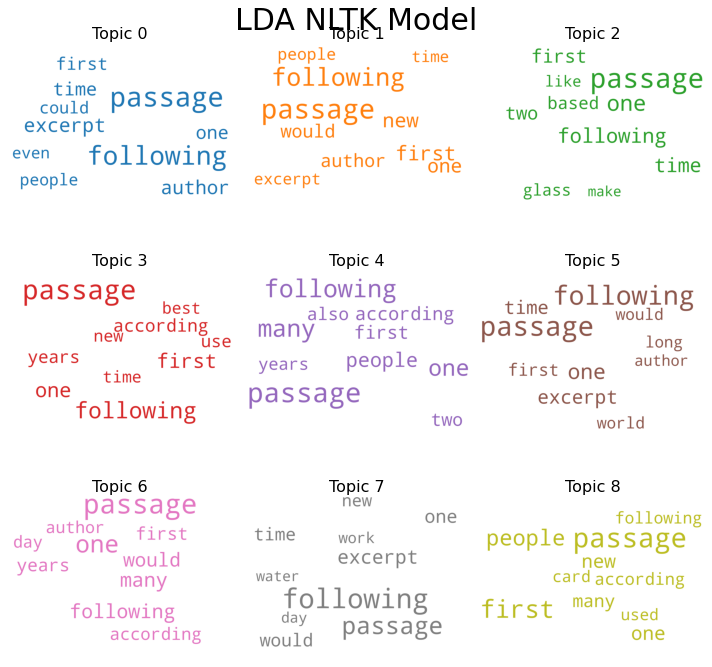

In [56]:
# 1. Wordcloud of Top N words in each topic
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors
model=lda_model_nltk

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=STOPWORDS,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)
topics = model.show_topics(formatted=False)

fig, axes = plt.subplots(3, 3, figsize=(10,10), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    fig.suptitle("LDA NLTK Model",fontsize=30)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [ ]:
'''
This Sklearn run LDA< LSI, NMK
'''
from sklearn.decomposition import NMF, LatentDirichletAllocation, TruncatedSVD
from sklearn.feature_extraction.text import CountVectorizer
 
NUM_TOPICS = 10
data=train_tokens
vectorizer = CountVectorizer(min_df=5, max_df=0.9, 
                             stop_words='english', lowercase=True, 
                             token_pattern='[a-zA-Z\-][a-zA-Z\-]{2,}')
data_vectorized = vectorizer.fit_transform(data)
 
# Build a Latent Dirichlet Allocation Model
lda_model_sklearn = LatentDirichletAllocation(n_components=NUM_TOPICS, max_iter=10, learning_method='online')
lda_Z = lda_model_sklearn.fit_transform(data_vectorized)
print(lda_Z.shape)  # (NO_DOCUMENTS, NO_TOPICS)
 
# Build a Non-Negative Matrix Factorization Model
nmf_model = NMF(n_components=NUM_TOPICS)
nmf_Z = nmf_model.fit_transform(data_vectorized)
print(nmf_Z.shape)  # (NO_DOCUMENTS, NO_TOPICS)
 
# Build a Latent Semantic Indexing Model
lsi_model_sklearn = TruncatedSVD(n_components=NUM_TOPICS)
lsi_Z = lsi_model_sklearn.fit_transform(data_vectorized)
print(lsi_Z.shape)  # (NO_DOCUMENTS, NO_TOPICS)
 
 
# Let's see how the first document in the corpus looks like in different topic spaces
print(lda_Z[0])
print(nmf_Z[0])
print(lsi_Z[0])
text = test_tokens[0]
x = lda_model_sklearn.transform(vectorizer.transform([text]))[0]
print(x, x.sum())

#Word Clouds of Top N Keywords in Each Topic
#Model=lda_sklearn

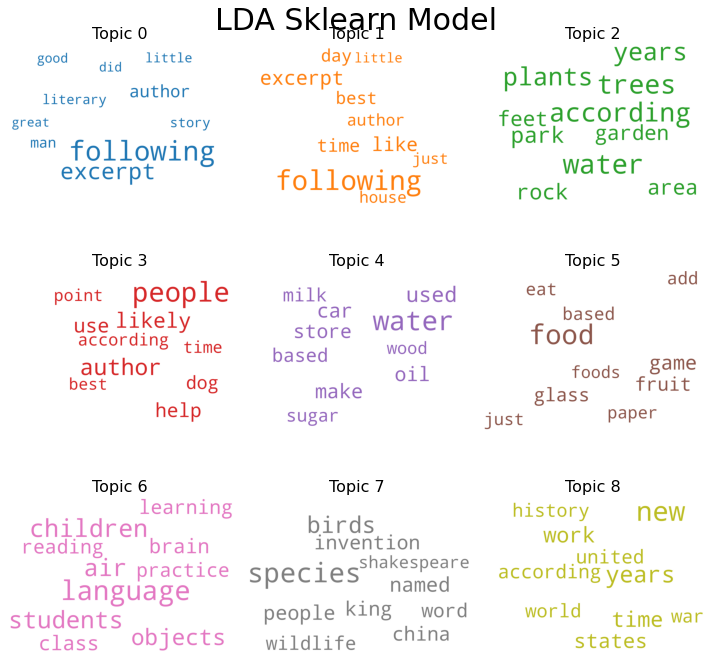

In [57]:

from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=STOPWORDS,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

fig, axes = plt.subplots(3, 3, figsize=(10,10), sharex=True, sharey=True)
#plt.title("LDA Sklearn Model")
for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    fig.suptitle("LDA Sklearn Model",fontsize=30)
    topic=lda_model_sklearn.components_[i]
    topic_words = dict([(vectorizer.get_feature_names()[i] , topic[i]) for i in topic.argsort()[:-15:-1]])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()

plt.show()

#Sklearn to run LDA topic modeling

Using Scikit-Learn for Topic Modeling Let’s now go through the same process with sklearn. This librabry offers a NMF implementation as well. The algorithms are more bare-bones than what we’ve seen with gensim but on the plus side, they implement the fit/transform interface we’re used with:

In [58]:
panel_lda_sklearn = pyLDAvis.sklearn.prepare(lda_model_sklearn, data_vectorized, vectorizer, mds='tsne')
panel_lda_sklearn

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/pairwise.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:348: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t

PreparedData(topic_coordinates=               x          y  topics  cluster       Freq
topic                                                  
8      32.420952   8.115230       1        1  21.111626
1       0.648955  71.707100       2        1  20.515214
0      71.019684   9.971006       3        1  12.661265
3       3.785981  33.185135       4        1  12.605800
2     -42.666500  -9.222070       5        1   9.060027
5      -3.621689 -43.526516       6        1   7.398139
4      -3.632402  -4.171708       7        1   6.583668
7     -36.584400  35.804413       8        1   3.706252
6      44.391380  50.615383       9        1   3.258151
9      40.235809 -31.591665      10        1   3.099856, topic_info=           Term         Freq        Total Category  logprob  loglift
2670    excerpt  1094.000000  1094.000000  Default  30.0000  30.0000
3041  following  2399.000000  2399.000000  Default  29.0000  29.0000
8145      water   719.000000   719.000000  Default  28.0000  28.0000
3046       food   379.000000   379.000000  Default  27.0000  27.0000
2358      earth   227.000000   227.000000  Default  26.0000  26.0000
...         ...          ...          ...      ...      ...      ...
47    according    49.862352   981.978944  Topic10  -5.0808   0.4935
4332       life    40.209047   478.647038  Topic10  -5.2959   0.9969
803      bodies    28.518489    63.272918  Topic10  -5.6395   2.6769
2833        far    31.476101   203.063104  Topic10  -5.5408   1.6095
995      called    31.638316   372.711602  Topic10  -5.5357   1.0074

[693 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
25        9  0.923064   academic
47        1  0.283102  according
47        2  0.069248  according
47        3  0.030551  according
47        4  0.156826  according
...     ...       ...        ...
8366      2  0.105224      young
8366      3  0.438433      young
8366      4  0.061381      young
8366      5  0.035075      young
8366      7  0.030690      young

[1575 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[9, 2, 1, 4, 3, 6, 5, 8, 7, 10])

In [ ]:
#this does not work
from sklearn.decomposition import NMF, LatentDirichletAllocation, TruncatedSVD
from sklearn.feature_extraction.text import CountVectorizer
#!pip install pyLDAvis
# !python -m pip install -U pyLDAvis
#!pip install --upgrade pandas

import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()

def Model_sklearn(NUM_TOPICS, data):
  vectorizer = CountVectorizer(min_df=5, max_df=0.9, 
                             stop_words='english', lowercase=True, 
                             token_pattern='[a-zA-Z\-][a-zA-Z\-]{2,}')
  data_vectorized = vectorizer.fit_transform(data)
  # Build a Latent Dirichlet Allocation Model
  lda_model_sklearn = LatentDirichletAllocation(n_components=NUM_TOPICS, max_iter=10, learning_method='online')
  lda_Z = lda_model_sklearn.fit_transform(data_vectorized)
  #print(lda_Z.shape)  # (NO_DOCUMENTS, NO_TOPICS)
  # Build a Non-Negative Matrix Factorization Model
  nmf_model = NMF(n_components=NUM_TOPICS)
  nmf_Z = nmf_model.fit_transform(data_vectorized)
  print(nmf_Z.shape)  # (NO_DOCUMENTS, NO_TOPICS)
  # Build a Latent Semantic Indexing Model
  lsi_model_sklearn = TruncatedSVD(n_components=NUM_TOPICS)
  lsi_Z = lsi_model_sklearn.fit_transform(data_vectorized)
  panel_lda = pyLDAvis.sklearn.prepare(lda_model_sklearn, data_vectorized, vectorizer, mds='tsne')
  panel_nmf=pyLDAvis.sklearn.prepare(nmf_model, data_vectorized, vectorizer, mds='tsne')
  return [panel_lda,panel_nmf]

NUM_TOPICS=10
#lda_model_sklearn = LatentDirichletAllocation(n_components=NUM_TOPICS, max_iter=10, learning_method='online')
data=train_tokens
panel_nmf_sklearn, panel_lda_sklearn=Model_sklearn(NUM_TOPICS, data)
panel_lda_sklearn

In [24]:
for index,topic in enumerate(lda_model_sklearn.components_):
    print(f'THE TOP 15 WORDS FOR TOPIC #{index}')
    print([vectorizer.get_feature_names()[i] for i in topic.argsort()[:-15:-1]])
    print('\n')

#5, 7,3,9,10,4,1,6,8,2    

THE TOP 15 WORDS FOR TOPIC #0
['language', 'school', 'english', 'students', 'writing', 'career', 'class', 'languages', 'novel', 'new', 'skills', 'stories', 'radio', 'style']


THE TOP 15 WORDS FOR TOPIC #1
['plants', 'according', 'used', 'water', 'years', 'plant', 'called', 'flowers', 'native', 'natural', 'seeds', 'grow', 'produce', 'feet']


THE TOP 15 WORDS FOR TOPIC #2
['following', 'trees', 'tree', 'river', 'town', 'miles', 'great', 'line', 'road', 'day', 'new', 'city', 'feet', 'way']


THE TOP 15 WORDS FOR TOPIC #3
['people', 'help', 'use', 'food', 'likely', 'author', 'children', 'make', 'according', 'provide', 'dog', 'animals', 'time', 'species']


THE TOP 15 WORDS FOR TOPIC #4
['water', 'make', 'based', 'just', 'oil', 'time', 'add', 'air', 'use', 'hot', 'glass', 'car', 'following', 'kitchen']


THE TOP 15 WORDS FOR TOPIC #5
['states', 'new', 'united', 'years', 'war', 'time', 'american', 'according', 'president', 'based', 'did', 'history', 'later', 'following']


THE TOP 15 WORDS

In [8]:

from gensim import similarities
 
lda_index = similarities.MatrixSimilarity(lda_model_nltk[corpus])
text = "The economy is working better than ever"
bow = dictionary.doc2bow(clean_text(text))
 
print(lsi_model_nltk[bow]) 
# Let's perform some queries
similarities = lda_index[lda_model_nltk[bow]]
# Sort the similarities
similarities = sorted(enumerate(similarities), key=lambda item: -item[1])
 
# Top most similar documents:
print(similarities[:10])
# [(104, 0.87591344), (178, 0.86124849), (31, 0.8604598), (77, 0.84932965), (85, 0.84843522), (135, 0.84421808), (215, 0.84184396), (353, 0.84038532), (254, 0.83498049), (13, 0.82832891)]
 
# Let's see what's the most similar document
document_id, similarity = similarities[0]
print(data[document_id][:1000])

[(0, 0.06987208792444607), (1, 0.01850667334770753), (2, -0.03325089007129088), (3, 0.0029999773621502096), (4, -0.02874317099255177), (5, -0.015572264875046128), (6, 0.0006167175960011644), (7, 0.008149267167417526), (8, -0.008688287675095819), (9, -0.003918128578334504)]
[(2216, 0.9985815), (2647, 0.997869), (2217, 0.99785024), (2656, 0.99784225), (2640, 0.9976254), (803, 0.99762416), (1940, 0.99758875), (1079, 0.9975769), (1960, 0.9975565), (6, 0.9975462)]
 TO37 A3000016 A
A3092216 A
2216.	Stuffed bell peppers are a simple, delicious way to add variety to your diet, and they look great, too. To make this dish, begin by cutting off the tops of six bell peppers and removing the ribs and seeds. Next, coat the hollow peppers inside and out with one tablespoon of olive oil and sprinkle them with salt and pepper. Place the peppers into a baking dish. Next, finely dice half an onion, one stick of celery, one carrot, and one small zucchini, and sauté them with oil in a frying pan until soft

# Assign Topics and probabilities for each model from Gensm and NLTK

In [61]:
 
def most_prob(text, model):
  return max((probability,idx) for idx, probability in model[dictionary.doc2bow(clean_text(text))])
  
 
def Assign_topics_Gensm(dat,model):
  i=0
  for text in dat:
    p, idx=most_prob(text,model) 
    idx=idx+1
    df1={'Probability': p,'Topics':idx}
    #print(p,idx)
    df1 =pd.DataFrame(df1, index=[i])
    if i==0:
      df=df1
    else:
      df=pd.concat([df,df1])
    i=i+1
  return df  



In [ ]:
text=train_tokens[0]
lsi_model_nltk[dictionary.doc2bow(clean_text(text))]

In [62]:

Test_Topics=Assign_topics_Gensm(test_tokens,lda_model_nltk)
#Test_Topics
Test_Topics_lda_nltk=pd.DataFrame(Test_Topics)
Test_Topics_lda_nltk.rename(columns={'Probability':'Probability_lda_nltk','Topics': 'Topics_lda_nltk'},inplace=True)
Test_Topics_lda_nltk


Train_Topics=Assign_topics_Gensm(train_tokens,lda_model_nltk)
#Test_Topics
Train_Topics_lda_nltk=pd.DataFrame(Train_Topics)
Train_Topics_lda_nltk.rename(columns={'Probability':'Probability_lda_nltk','Topics': 'Topics_lda_nltk'},inplace=True)
Train_Topics_lda_nltk



,Probability_lda_nltk,Topics_lda_nltk
0,0.991587,7
1,0.989205,7
2,0.821716,8
3,0.900329,10
4,0.738222,2
...,...,...
3495,0.579758,8
3496,0.661440,1
3497,0.988747,8
3498,0.463758,8


In [63]:

Test_Topics=Assign_topics_Gensm(test_tokens,lsi_model_nltk)
#Test_Topics
Test_Topics_lsi_nltk=pd.DataFrame(Test_Topics)
Test_Topics_lsi_nltk.rename(columns={'Probability':'Probability_lsi_nltk','Topics': 'Topics_lsi_nltk'},inplace=True)
Test_Topics_lsi_nltk


Train_Topics=Assign_topics_Gensm(train_tokens,lsi_model_nltk)
#Test_Topics
Train_Topics_lsi_nltk=pd.DataFrame(Train_Topics)
Train_Topics_lsi_nltk.rename(columns={'Probability':'Probability_lsi_nltk','Topics': 'Topics_lsi__nltk'},inplace=True)
#Train_Topics_lsi_nltk


In [12]:
Test_Topics_lsi_nltk

,Probability_lsi_nltk,Topics_lsi_nltk
0,1.663359,1
1,3.069114,1
2,1.911203,1
3,2.458850,1
4,3.513053,7
...,...,...
295,1.339135,1
296,1.801592,1
297,1.840824,1
298,2.254647,1


In [138]:
filter=Test_Topics_lsi_nltk['Topics_lsi_nltk'] !=1
Test_Topics_lsi_nltk[filter]


,Probability_lsi_nltk,Topics_lsi_nltk
12,0.428673,4
15,0.703083,8
20,0.126031,10
31,0.351451,4
35,0.321950,4
46,0.374116,10
57,0.135228,10
62,0.155004,10
67,0.339542,8
87,0.119355,10


In [139]:
set(Train_Topics_lsi_nltk['Topics_lsi__nltk'].values)

{1, 2, 4, 5, 6, 7, 8, 9, 10}

In [64]:

def most_prob(text, model):
  return max((probability,idx) for idx, probability in model[gensm_dictionary.doc2bow(clean_text(text))])
  
 
def Assign_topics_Gensm(dat,model):
  i=0
  for text in dat:
    p, idx=most_prob(text,model) 
    idx=idx+1
    df1={'Probability': p,'Topics':idx}
    #print(p,idx)
    df1 =pd.DataFrame(df1, index=[i])
    if i==0:
      df=df1
    else:
      df=pd.concat([df,df1])
    i=i+1
  return df  
Test_Topics=Assign_topics_Gensm(test_tokens,lda_model_gensm)
#Test_Topics
Test_Topics_lda_gensm=pd.DataFrame(Test_Topics)
Test_Topics_lda_gensm.rename(columns={'Probability':'Probability_lda_gensm','Topics': 'Topics_lda_gensm'},inplace=True)
Test_Topics_lda_gensm


Train_Topics=Assign_topics_Gensm(train_tokens,lda_model_gensm)
#Test_Topics
Train_Topics_lda_gensm=pd.DataFrame(Train_Topics)
Train_Topics_lda_gensm.rename(columns={'Probability':'Probability_lda_gensm','Topics': 'Topics_lda_gensm'},inplace=True)
Train_Topics_lda_gensm

,Probability_lda_gensm,Topics_lda_gensm
0,0.681020,2
1,0.605197,10
2,0.740492,1
3,0.496627,3
4,0.860433,1
...,...,...
3495,0.581821,10
3496,0.609685,4
3497,0.764828,10
3498,0.526372,10


In [ ]:
#output and save those files
[len(train_tokens),len(test_tokens)]

len(train_processed_docs),len(tokenized_data)
pd.DataFrame(tokenized_data).to_csv('tokenized_data.csv')
pd.DataFrame(train_processed_docs).to_csv('train_processed_docs.csv')
pd.DataFrame(train_tokens).to_csv('train_tokens.csv')
pd.DataFrame(test_tokens).to_csv('test_tokens.csv')

In [ ]:
#train_processed_docs=pd.read_csv('https://raw.githubusercontent.com/yaolihua081/AIG_PC/main/train_processed_docs.csv')
#train_processed_docs.shape#3500,133
#tokenized_data=pd.read_csv('https://raw.githubusercontent.com/yaolihua081/AIG_PC/main/tokenized_data.csv')
#tokenized_data.shape#3500,146
#train_token=pd.read_csv('https://raw.githubusercontent.com/yaolihua081/AIG_PC/main/train_tokens.csv')


(3500, 146)

In [65]:
def print_topics(model, vectorizer, top_n=10):
    for idx, topic in enumerate(model.components_):
        print("Topic %d:" % (idx))
        print([(vectorizer.get_feature_names()[i], topic[i])
                        for i in topic.argsort()[:-top_n - 1:-1]])
 
print("LDA Model:")
print_topics(lda_model_sklearn, vectorizer)
print("=" * 20)
 
print("NMF Model:")
print_topics(nmf_model, vectorizer)
print("=" * 20)
 
print("LSI Model:")
print_topics(lsi_model_sklearn, vectorizer)
print("=" * 20)
 

LDA Model:
Topic 0:
[('following', 911.5623605500883), ('excerpt', 622.4679134339334), ('author', 307.84584369239485), ('man', 216.04969319817164), ('story', 190.07348017771164), ('literary', 187.03090254058733), ('little', 176.69053935573672), ('good', 174.53273492597597), ('did', 166.50412011640333), ('great', 164.77522279071292)]
Topic 1:
[('following', 1133.1704263676393), ('excerpt', 534.5083649712741), ('like', 494.5448179306149), ('time', 434.31377430905366), ('day', 394.80407974215285), ('best', 391.396333746953), ('author', 346.6982551190341), ('house', 332.8055966640513), ('just', 301.62499296741413), ('little', 233.24880792331632)]
Topic 2:
[('water', 213.85816916558375), ('trees', 202.68645399565932), ('according', 199.51281869925901), ('plants', 180.77141145676512), ('years', 178.55026449179752), ('park', 143.8007952796155), ('rock', 134.67499385349504), ('area', 129.53027689901813), ('feet', 127.81144775916769), ('garden', 124.39573625457783)]
Topic 3:
[('people', 417.555

#Implement Similarity

In [42]:
from sklearn.metrics.pairwise import euclidean_distances

text = test_tokens[1] 
x = nmf_model.transform(vectorizer.transform([text]))[0]
print(x)
def most_similar(x, Z, top_n=5):
    dists = euclidean_distances(x.reshape(1, -1), Z)
    pairs = enumerate(dists[0])
    most_similar = sorted(pairs, key=lambda item: item[1])[:-top_n:-1]
    #most_similar = sorted(pairs, key=lambda item: item[1])[:top_n]
    #most_similar = sorted(pairs, key=lambda item: item[1])[:-5]
    return most_similar
 
similarities = most_similar(x, nmf_Z)
document_id, similarity = similarities[0]
print(data[document_id][:1000])

[0.3077672  0.         0.         0.         0.         0.00084712
 0.02509472 0.         0.13971953 0.05073371]
 TO11 A2000244 B
A2090844 B
0844.	Traditionally, management of water resources has focused on surface water or ground water as if they were separate entities. As the development of land and water resources increases, it is apparent that development of either of these resources affects the quantity and quality of the other. Nearly all surface-water features (streams, lakes, reservoirs, wetlands, and estuaries) interact with ground water. These interactions take many forms. In many situations, surface-water bodies gain water and solutes from ground-water systems and in others the surface-water body is a source of ground-water recharge and causes changes in ground-water quality. As a result, withdrawal of water from streams can deplete ground water or conversely, pumpage of ground water can deplete water in streams, lakes, or wetlands. Pollution of surface water can cause degra

In [41]:
similarities

[(844, 2.27915293379289),
 (2964, 1.980388561990109),
 (3100, 1.777559810564699),
 (1895, 1.7120471530762722)]

In [43]:
print(text)
document_id, similarity = similarities[0]
print(data[document_id])

 TO45 A1000401 B
A1093501 B
3501.	Though she had been a carpenter for seven years, Hannah had never worked in a shop she could call her own. She had always relied on leased spaces, which reduced her overall profits. After working out cost estimates, she decided to build a workshop on a vacant portion of her property in order to eliminate her monthly rental payment. As she began thinking through her plans, she realized having her own workshop would yield additional benefits. For example, by avoiding the commute to and from the leased space, she could spend more time being productive. She would be able to install a built-in surveillance system for added security. She could also have a small seating area for meetings with clients, where some of her finished products—such as cabinets, tables, and chairs—could be displayed. Within six months, Hannah’s workshop was completed, and over time, it paid off as one of the best business investments she had ever made.

According to the passage, Hann

#Plotting words and documents in 2D with SVD
We can use SVD with 2 components (topics) to display words and documents in 2D. The process is really similar. Let’s start with displaying documents since it’s a bit more straightforward.

In [17]:
import pandas as pd
from bokeh.io import push_notebook, show, output_notebook
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, LabelSet
output_notebook()

In [18]:
svd = TruncatedSVD(n_components=2)
documents_2d = svd.fit_transform(data_vectorized)
 
df = pd.DataFrame(columns=['x', 'y', 'document'])
df['x'], df['y'], df['document'] = documents_2d[:,0], documents_2d[:,1], range(len(data))
 
source = ColumnDataSource(ColumnDataSource.from_df(df))
labels = LabelSet(x="x", y="y", text="document", y_offset=8,
                  text_font_size="8pt", text_color="#555555",
                  source=source, text_align='center')
 
plot = figure(plot_width=600, plot_height=600)
plot.circle("x", "y", size=12, source=source, line_color="black", fill_alpha=0.8)
plot.add_layout(labels)
show(plot, notebook_handle=True)

In [19]:
svd = TruncatedSVD(n_components=2)
words_2d = svd.fit_transform(data_vectorized.T)
 
df = pd.DataFrame(columns=['x', 'y', 'word'])
df['x'], df['y'], df['word'] = words_2d[:,0], words_2d[:,1], vectorizer.get_feature_names()
 
source = ColumnDataSource(ColumnDataSource.from_df(df))
labels = LabelSet(x="x", y="y", text="word", y_offset=8,
                  text_font_size="8pt", text_color="#555555",
                  source=source, text_align='center')
 
plot = figure(plot_width=600, plot_height=600)
plot.circle("x", "y", size=12, source=source, line_color="black", fill_alpha=0.8)
plot.add_layout(labels)
show(plot, notebook_handle=True)

#Assign topics to each PC items by LDA, LSI, NMF from Sklearn package

In [67]:
'''
 for each text, choose the highest probability,
 Assign the topic for each document
'''
import numpy as np
#nmf_model.transform(vectorizer.transform([text]))[0]
def index_max(text,model):
  x = model.transform(vectorizer.transform([text]))[0]
  index_max = np.argmax(x)+1
  return [index_max,round(x[index_max-1],4)]

def Assign_Topic(dat_tokens,model):
    Topic=[]
    for text in dat_tokens:
      Topic.append(index_max(text,model))
    return Topic   



In [68]:
Test_Topics=Assign_Topic(test_tokens,lsi_model_sklearn)     
Test_Topics_lsi_sklearn=pd.DataFrame(Test_Topics,columns=['Topics_lsi_sklearn','Probability_lsi_sklearn']) 
Train_Topics=Assign_Topic(train_tokens, lsi_model_sklearn)     
Train_Topics_lsi_sklearn=pd.DataFrame(Train_Topics,columns=['Topics_lsi_sklearn','Probability_lsi_sklearn']) 

Test_Topics=Assign_Topic(test_tokens,lda_model_sklearn)     
Test_Topics_lda_sklearn=pd.DataFrame(Test_Topics,columns=['Topics_lda_sklearn','Probability_lda_sklearn']) 
Train_Topics=Assign_Topic(train_tokens, lda_model_sklearn)     
Train_Topics_lda_sklearn=pd.DataFrame(Train_Topics,columns=['Topics_lda_sklearn','Probability_lda_sklearn']) 

In [69]:
Test_Topics=Assign_Topic(test_tokens,nmf_model)     
Test_Topics_nmf_sklearn=pd.DataFrame(Test_Topics,columns=['Topics_nmf_sklearn','Probability_nmf_sklearn']) 
Train_Topics=Assign_Topic(train_tokens, nmf_model)     
Train_Topics_nmf_sklearn=pd.DataFrame(Train_Topics,columns=['Topics_nmf_sklearn','Probability_nmf_sklearn']) 

#Assign Topics by LDA from gensem

In [63]:
text = "The economy is working better than ever"
bow = dictionary.doc2bow(clean_text(text))

print(lda_model[bow])
# [(0, 0.020005183), (1, 0.020005869), (2, 0.02000626), (3, 0.020005472), (4, 0.020009108), (5, 0.020005926), (6, 0.81994385), (7, 0.020006068), (8, 0.020006327), (9, 0.020005994)]
 

[(0, 0.020004738), (1, 0.020005247), (2, 0.02000424), (3, 0.38480148), (4, 0.4551603), (5, 0.020002205), (6, 0.020009995), (7, 0.020002494), (8, 0.020001678), (9, 0.020007651)]


In [70]:
'''
Identify item ID and keys for each PC items
'''

import re
def Assign_id(PCdoc):
  ID_pattern=r'([A-B][\d]{6,7})'
  IDs = re.findall(ID_pattern, PCdoc)
  IDs_unique=IDs[1]
  Key_pattern=r'(\b[A-D]\b)'
  Keys=re.findall(Key_pattern, PCdoc)
  Keys_unique=Keys[1] 
  num=str(IDs_unique)[7:10]
  df ={'ID_Name':IDs_unique ,'Key':Keys_unique }
  df=pd.DataFrame(df,index=[num])
  return df

def ID(PC_tokens):
  i=0
  for PCdoc in PC_tokens:
    df1=Assign_id(PCdoc)
    if i==0:
      df=df1
    else:    
      df=pd.concat([df, df1])
    i=i+1   
  return df

Test_ID=ID(test_tokens)


Train_ID=ID(train_tokens)



# Combine to create files for Item ID, Topics, probability, from different models

Test_Item
Train_Item

In [71]:
 '''
 Cobine, train and test data, assign Item ID, Key, and Topics
 '''
 def combineTopics(Test_ID, Test_Topics):
   temp=pd.DataFrame(Test_ID['ID_Name'].values)
   temp1=pd.concat([temp,pd.DataFrame(Test_Topics[Test_Topics.columns.values[0]].values)],axis=1).reindex(temp.index)
 
   temp2=pd.concat([temp1,pd.DataFrame(Test_Topics[Test_Topics.columns.values[1]].values)],axis=1).reindex(temp1.index)
   temp2=pd.concat([temp2,pd.DataFrame(Test_ID['Key'].values)],axis=1).reindex(temp2.index)
   #temp2.columns=['ID_Name','Topics','Probability','Answer_Key']
   temp2.columns=['ID_Name',Test_Topics.columns.values[0],Test_Topics.columns.values[1],'Answer_Key']
   return temp2

 

In [73]:
Test_Item_lda_sklearn=combineTopics(Test_ID, Test_Topics_lda_sklearn)
Train_Item_lda_sklearn=combineTopics(Train_ID, Train_Topics_lda_sklearn)
Test_Item_lsi_sklearn=combineTopics(Test_ID, Test_Topics_lsi_sklearn)
Train_Item_lsi_sklearn=combineTopics(Train_ID, Train_Topics_lsi_sklearn)
Test_Item_nmf_sklearn=combineTopics(Test_ID, Test_Topics_nmf_sklearn)
Train_Item_nmf_sklearn=combineTopics(Train_ID, Train_Topics_nmf_sklearn)

In [74]:
Test_Item_lda_nltk=combineTopics(Test_ID, Test_Topics_lda_nltk)
Train_Item_lda_nltk=combineTopics(Train_ID, Train_Topics_lda_nltk)
Test_Item_lsi_nltk=combineTopics(Test_ID, Test_Topics_lsi_nltk)
Train_Item_lsi_nltk=combineTopics(Train_ID, Train_Topics_lsi_nltk)


In [75]:
Test_Item_lda_gensm=combineTopics(Test_ID, Test_Topics_lda_gensm)
Train_Item_lda_gensm=combineTopics(Train_ID, Train_Topics_lda_gensm)



In [76]:
temp=pd.merge(Test_Item_lda_sklearn,   Test_Item_nmf_sklearn,how='inner')
Test_Item_sklearn=pd.merge(Test_Item_lsi_sklearn,temp,how='inner')

temp=pd.merge(Train_Item_lda_sklearn,   Train_Item_nmf_sklearn,how='inner')
Train_Item_sklearn=pd.merge(Train_Item_lsi_sklearn,temp,how='inner')

In [159]:
filter1=Train_Item['Topics_lda_sklearn']==Train_Item['Topics_lsi_sklearn']
filter2=Train_Item['Topics_lda_sklearn']==Train_Item['Topics_nmf_sklearn']
filter3=Train_Item['Topics_lsi_sklearn']==Train_Item['Topics_nmf_sklearn']
sum(filter1),sum(filter2), sum(filter3)

(433, 202, 533)

In [78]:
temp=pd.merge(Test_Item_lda_sklearn,   Test_Item_lda_nltk,how='inner')
Test_Item_Ida_all=pd.merge(Test_Item_lda_gensm,temp,how='inner')

temp=pd.merge(Train_Item_lda_sklearn,   Train_Item_lda_nltk,how='inner')
Train_Item_Ida_all=pd.merge(Train_Item_lda_gensm,temp,how='inner')


In [79]:
Test_Item_Isi_all=pd.merge(Test_Item_lsi_sklearn,   Test_Item_lsi_nltk,how='inner')
Train_Item_Isi_all=pd.merge(Train_Item_lsi_sklearn,   Train_Item_lsi_nltk,how='inner')


#OutPut Topics and their probabilities for each Items from all models

In [81]:
Test_Item_sklearn.to_csv('PCItem35-37_Topics_sklearn.csv')
Train_Item_sklearn.to_csv('PCItem00-35_Topics_sklearn.csv')

Test_Item_Ida_all.to_csv('PCItem35-37_Topics_Ida.csv')
Train_Item_Ida_all.to_csv('PCItem00-35_Topics_Ida.csv')

Test_Item_Isi_all.to_csv('PCItem35-37_Topics_Isi.csv')
Train_Item_Isi_all.to_csv('PCItem00-35_Topics_Isi.csv')

# Read in CVS files

In [84]:
Test_Item_sklearn=pd.read_csv('PCItem35-37_Topics_sklearn.csv')
Train_Item_sklearn=pd.read_csv('PCItem00-35_Topics_sklearn.csv')


Test_Item_Ida_all=pd.read_csv('PCItem35-37_Topics_Ida.csv')
Train_Item_Ida_all=pd.read_csv('PCItem00-35_Topics_Ida.csv')

Test_Item_Isi_all=pd.read_csv('PCItem35-37_Topics_Isi.csv')
Train_Item_Isi_all=pd.read_csv('PCItem00-35_Topics_Isi.csv')



In [ ]:
pd.DataFrame(train_tokens).to_csv('train_tokens.csv')
pd.DataFrame(test_tokens).to_csv('test_tokens.csv')

# Check term distributions in each topics 

# plot pyLDAvis for :LDA_sklearn, with num_topics=10 and 20. For 20 topics, ther eare two s;lightly overlap

#t-SNE Clustering Chart
https://www.machinelearningplus.com/nlp/topic-modeling-visualization-how-to-present-results-lda-models/

In [13]:
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

In [85]:
# Get topic weights and dominant topics ------------
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook

# Get topic weights
topic_weights = []
for i, row_list in enumerate(lda_model_nltk[corpus]):
    topic_weights.append([w for i, w in row_list])

# Array of topic weights    
arr = pd.DataFrame(topic_weights).fillna(0).values
# Keep the well separated points (optional)
arr = arr[np.amax(arr, axis=1) > 0.35]

# Dominant topic number in each doc
topic_num = np.argmax(arr, axis=1)

# tSNE Dimension Reduction
tsne_model = TSNE(n_components=2, verbose=1, random_state=0, angle=.99, init='pca')
tsne_lda = tsne_model.fit_transform(arr)

# Plot the Topic Clusters using Bokeh
output_notebook()
n_topics = 10
mycolors = np.array([color for name, color in mcolors.TABLEAU_COLORS.items()])
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), 
              plot_width=900, plot_height=700)
plot.scatter(x=tsne_lda[:,0], y=tsne_lda[:,1], color=mycolors[topic_num])
show(plot)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 3432 samples in 0.006s...
[t-SNE] Computed neighbors for 3432 samples in 0.072s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3432
[t-SNE] Computed conditional probabilities for sample 2000 / 3432
[t-SNE] Computed conditional probabilities for sample 3000 / 3432
[t-SNE] Computed conditional probabilities for sample 3432 / 3432
[t-SNE] Mean sigma: 0.000182


/usr/local/lib/python3.7/dist-packages/scipy/linalg/decomp_qr.py:20: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  kwargs['lwork'] = ret[-2][0].real.astype(numpy.int)
/usr/local/lib/python3.7/dist-packages/scipy/linalg/decomp_qr.py:20: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, ch

[t-SNE] KL divergence after 250 iterations with early exaggeration: 60.683350


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:348: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:349: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  best_error = np.finfo(np.float).max


[t-SNE] KL divergence after 1000 iterations: 0.539687


In [ ]:
# Display setting to show more characters in column
pd.options.display.max_colwidth = 100

sent_topics_sorteddf_mallet = pd.DataFrame()
sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet, 
                                             grp.sort_values(['Perc_Contribution'], ascending=False).head(1)], 
                                            axis=0)

# Reset Index    
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Representative Text"]
# Show
sent_topics_sorteddf_mallet.head(10)

In [86]:
Train_Item_Ida_all

,Unnamed: 0,ID_Name,Probability_lda_gensm,Topics_lda_gensm,Answer_Key,Topics_lda_sklearn,Probability_lda_sklearn,Probability_lda_nltk,Topics_lda_nltk
0,0,A2090000,0.681020,2,D,5,0.4980,0.991587,7
1,1,A2090001,0.605197,10,C,2,0.3666,0.989205,7
2,2,A2090002,0.740492,1,A,2,0.3424,0.821716,8
3,3,A2090003,0.496627,3,C,9,0.4919,0.900329,10
4,4,A2090003,0.860433,1,D,8,0.3444,0.738222,2
...,...,...,...,...,...,...,...,...,...
3495,3495,B5093495,0.581821,10,A,1,0.4744,0.579758,8
3496,3496,B5093496,0.609685,4,D,2,0.5095,0.661440,1
3497,3497,B5093497,0.764828,10,A,1,0.4983,0.988748,8
3498,3498,B5093498,0.526372,10,B,2,0.5552,0.463758,8


In [ ]:
print(train_tokens[0])
#panel.token_table
#combined=panel
#combined.save('LDA_Topic5.html')
#from google.colab import files
#files.download('LDA_Topics5.html')
#combined

 TO9 A2000380 D 
A2090000 D
0000.	Today we may take for granted that blue jeans are indeed blue, but what are the origins of that color? Before synthetic dyes were developed, the indigo plant was responsible for supplying the world's textile industry with a deep, rich blue color. The indigo plant is native to several areas of the world, including southern and eastern Africa, tropical America, and Asia, but it was in India that the industry truly flourished. The British established commercial cultivation of indigo in the 18th century, using the dye for military and hospital uniforms, as well as for working class garments. This lasted until the early 20th century, when the use of synthetic alternatives caused the industry to collapse. Today, however, health and pollution concerns have resulted in an increasing demand for natural dyes, and we may see the indigo industry succeed again.

According to the passage, the natural indigo industry

A.	once supplied fabric for British military unif

In [89]:
filter=Train_Item_Ida_all['Probability_lda_sklearn'] > 0.8
#df=pd.DataFrame(Train_Item[filter].index,Train_Item[filter]['Topics','Probability'])
#df.columns=['ID_Name','Topics','Probability','Answer_Key']
#df
#(Train_Item[filter]['Topics']).unique()
sum(filter)
Train_08=Train_Item_Ida_all[filter]
temp=Train_08.groupby(['Topics_lda_sklearn']).count().sort_values(by='ID_Name')[:-5:-1]
TopicOne=temp.index.values[0]#topic 7 that has most items with high probability
TopicTwo=temp.index.values[1]
TopicOne,TopicTwo#9,2
temp

,Unnamed: 0,ID_Name,Probability_lda_gensm,Topics_lda_gensm,Answer_Key,Probability_lda_sklearn,Probability_lda_nltk,Topics_lda_nltk
Topics_lda_sklearn,,,,,,,,
9,109,109,109,109,109,109,109,109
2,28,28,28,28,28,28,28,28
1,17,17,17,17,17,17,17,17
4,15,15,15,15,15,15,15,15


In [93]:


filter=Train_Item_Ida_all['Topics_lda_sklearn']==TopicOne
Train_Item_Highest_Probability=Train_Item_Ida_all[filter].sort_values(by='Probability_lda_sklearn')[:-5:-1].index.values[0]
#item 15, 1032, identified to be topic 8(1-10) with very high probability
Train_Item_Ida_all[filter].sort_values(by='Probability_lda_sklearn')[:-15:-1]

,Unnamed: 0,ID_Name,Probability_lda_gensm,Topics_lda_gensm,Answer_Key,Topics_lda_sklearn,Probability_lda_sklearn,Probability_lda_nltk,Topics_lda_nltk
127,127,A3090127,0.447719,6,A,9,0.9908,0.571689,7
212,212,A1090212,0.949988,7,B,9,0.9900,0.992173,7
360,360,B2090360,0.704241,6,B,9,0.9898,0.728289,4
104,104,A1090104,0.957131,2,A,9,0.9887,0.991174,6
91,91,B2090091,0.602148,6,A,9,0.9887,0.288735,1
378,378,A2090378,0.963992,9,B,9,0.9885,0.991587,4
63,63,B1090063,0.501871,9,C,9,0.9880,0.990624,7
430,430,A2090430,0.528092,2,A,9,0.9878,0.738646,10
383,383,A1090383,0.670117,6,B,9,0.9859,0.988605,10
140,140,B5090140,0.384226,2,C,9,0.9852,0.519373,3


In [95]:
# LDA_Sklearn identified to be topic 9 with high probability
#LDA_NLTK identified with topic 7 with high probability
print(train_tokens[127])
print(train_tokens[212])# this item, all model identified withvery high probability
#LDA_nltk---7
#LDA_Sklearn---9
print(train_tokens[63])
print(train_tokens[3024])
#NLTK ifentified ti bt topics 10, items 430,383
print(train_tokens[430])
print(train_tokens[383])

 TO2 A3000027 D
A3090127 A
0127.	Ann (or Marian) Evans, known by her pen name George Eliot, was born in 1819 in central England, where her father managed Arbury Estate's farms. Before she was a year old, her family moved to Griff, where they would reside until Eliot reached adulthood. Between 1828 and 1832, Eliot attended boarding school in Nuneaton, where she was heavily influenced by the school's governess, who instilled a strong religious sensibility in her. From 1832 to 1835, in the nearby town of Coventry, Eliot attended another school administered by daughters of a Baptist minister. Her education was cut short at age 17 when her mother died. Being the youngest child, she returned home to run her father's household. In 1841 she and her father moved to Coventry, where Eliot met Caroline and Charles Bray and was influenced by them to embrace more progressive ideas. After her father's death, Eliot advanced her education through her own intensive reading. These experiences, localities

In [ ]:
Train_Item[filter].sort_values(by='Probability')[:-5:-1]

,ID_Name,Topics,Probability,Answer_Key
15,A3090015,7,0.9909,D
1032,B2091032,7,0.9890,D
20,A3090020,7,0.9890,A
93,B2090093,7,0.9887,A


In [ ]:
import seaborn as sns

import matplotlib.pyplot as plt
import hashlib
import matplotlib.style as style
style.use('fivethirtyeight')

plt.scatter(cars_data.Horsepower, cars_data.Miles_per_Gallon)
plt.xlabel('Horsepower')
plt.ylabel('MPG')
plt.title('First scatter plot!')
plt.show()

for region in cars_data.Origin.unique():
  data_subset = cars_data[cars_data.Origin == region]
  plt.scatter(data_subset.Horsepower, data_subset.Miles_per_Gallon, label=region)

plt.xlabel('Horsepower')
plt.ylabel('MPG')
plt.title('Second scatter plot!')
plt.legend()
plt.show()

figsize=(15,15)
sns.lineplot(x='month', y='cases_per_ten_thosand',color='blue',data=month_case)
sns.lineplot(x='month', y='death_per_ten_thosand',color='red',data=month_death)

#sns.lineplot(x='month', y='total_cases',color='blue',data=month_case)
#sns.lineplot(x='month', y='total_deaths',color='red',data=month_death)
plt.title('USA COVID-19 Cases and Deaths By Month')
plt.show()


style.use('fivethirtyeight')

plt.figure(figsize=(10, 10))
sns.lineplot(x='Year',y='total_deaths', hue='Cause_group', data=CA_dat)
plt.title("Total death in California grouped by the Cause without COVID_19 data by 2020-10-6")
plt.show()


In [ ]:
import seaborn as sns

import matplotlib.pyplot as plt
import hashlib
import matplotlib.style as style
style.use('fivethirtyeight')


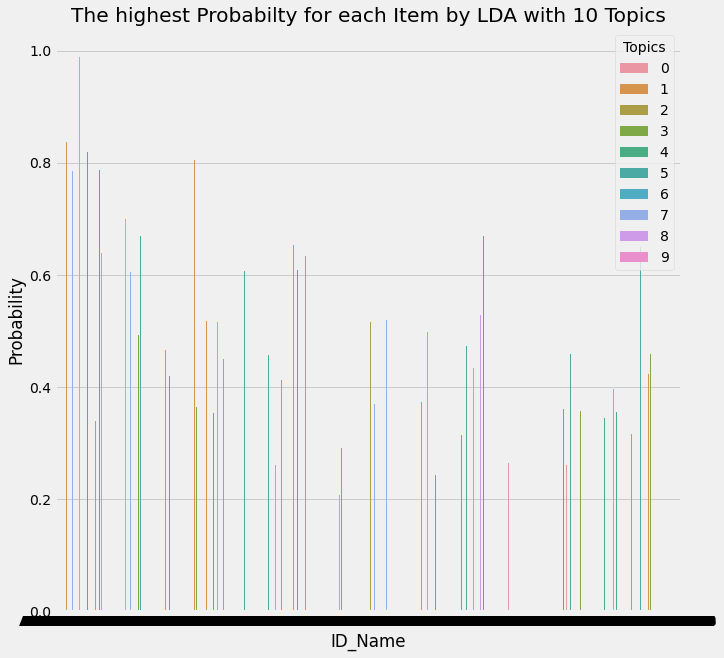

In [ ]:
style.use('fivethirtyeight')

plt.figure(figsize=(10, 10))
sns.barplot(x='ID_Name',y='Probability', hue='Topics', data=Train_Item)
plt.title("The highest Probabilty for each Item by LDA with 10 Topics")
plt.show()


In [ ]:
import altair as alt
alt_chart=alt.Chart(Train_Item,title="Topics and probability for Each item").mark_point().encode(
    x='ID_Name:N',
    y='Probability:Q',
    color='Probability:Q',
    tooltip='Topics:N'
).interactive()

alt_chart


alt.Chart(...)

In [ ]:
plt.bar('Topics', 'Probability', width=0.8, bottom=None, align='center', data=Train_Item)
